In [12]:
import scanpy as sc
import matplotlib.pyplot as plt
import scFates as scf
import scvelo as scv
import numpy as np
scv.set_figure_params(figsize=(3.5,3.5))

In [7]:
scf.set_figure_pubready()
adata=sc.read("adata_ChC.h5ad")

In [8]:
sc.tl.rank_genes_groups(adata,"leiden",use_raw=False)

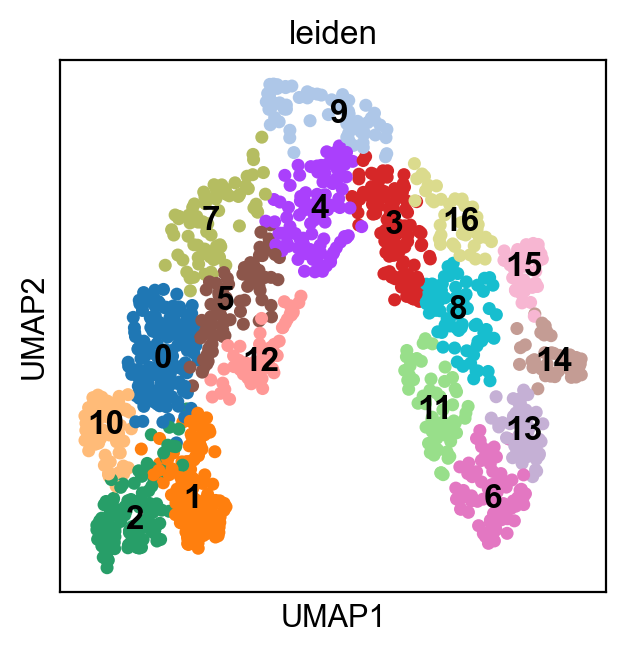

In [9]:
sc.pl.umap(adata,color="leiden",legend_loc="on data")

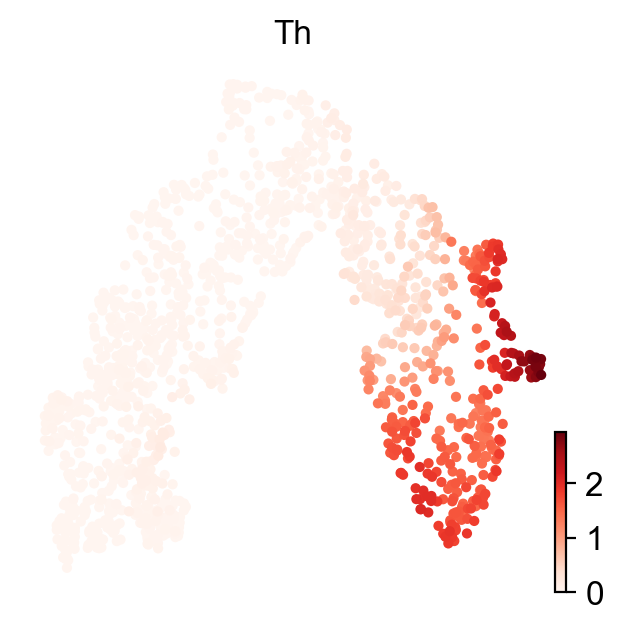

In [10]:
scv.pl.umap(adata,color="Th",legend_loc="on data",use_raw=False,cmap="Reds",smooth=True)

saving figure to file ./figures/scvelo_sel.svg


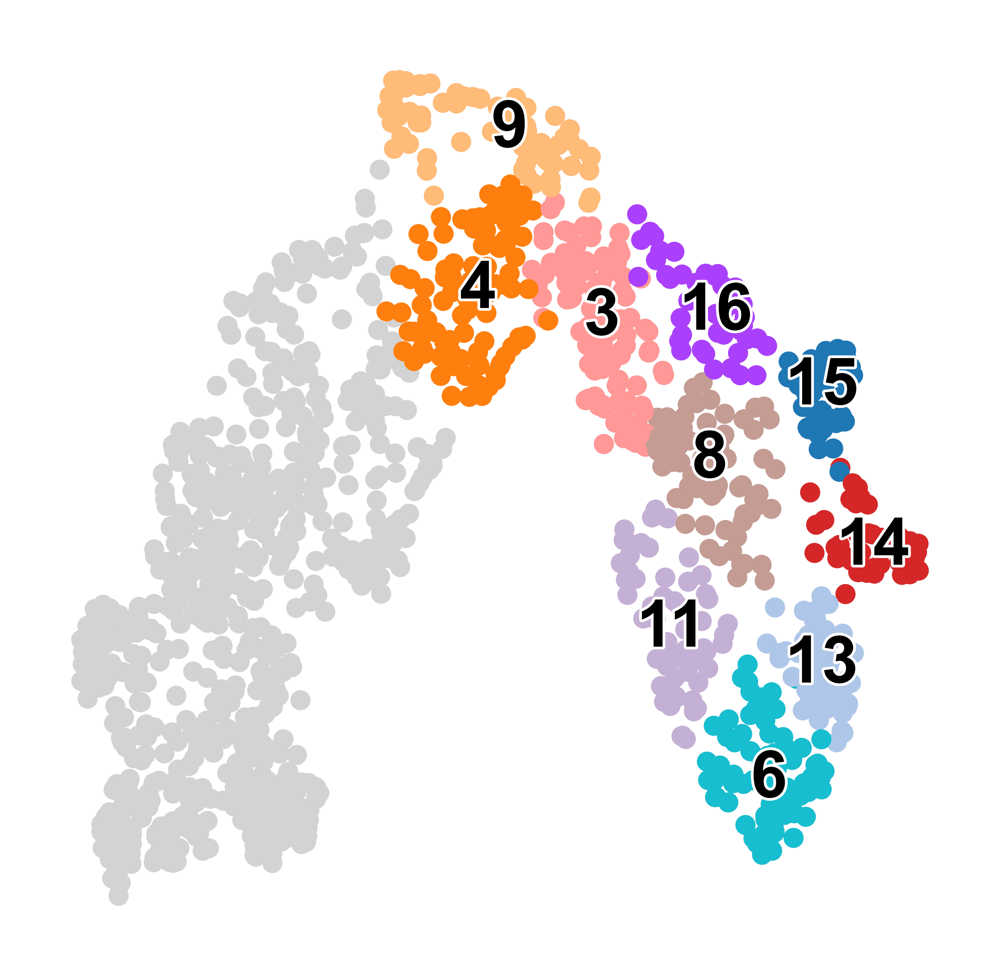

In [13]:
adata.uns["leiden_colors"]=np.array(['#98df8a', '#8c564b', '#dbdb8d', '#ff9896', '#ff7f0e', '#279e68',
       '#17becf', '#e377c2', '#c49c94', '#ffbb78', '#b5bd61',
       '#c5b0d5', '#f7b6d2', '#aec7e8','#d62728', '#1f77b4','#aa40fc'],
      dtype=object)
scv.pl.umap(adata,color="leiden",title="",groups=["4","16","15","3","9","8","11","13","14","6"],figsize=(3,3),save="sel.svg",dpi=600)

In [14]:
adata_focus=adata[adata.obs.leiden.isin(["4","16","15","3","9","8","11","13","14","6"])]

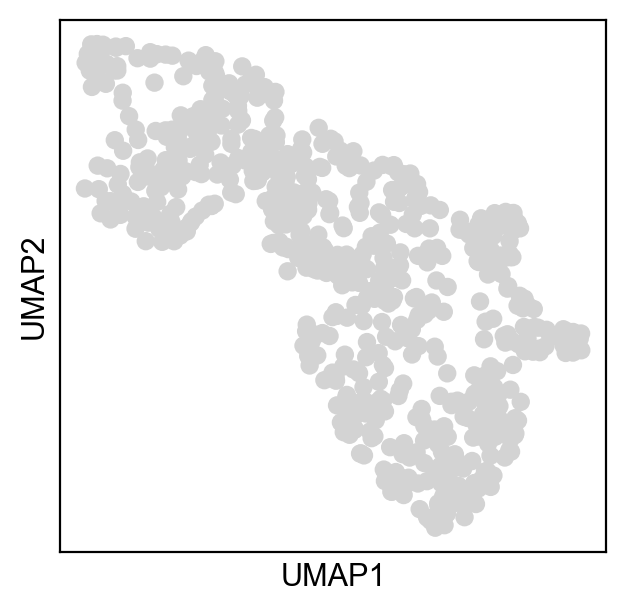

In [15]:
sc.pl.umap(adata_focus)

In [16]:
sc.pp.filter_genes(adata,min_cells=3)

In [17]:
sc.tl.rank_genes_groups(adata_focus,"leiden",use_raw=False)

Trying to set attribute `.uns` of view, copying.


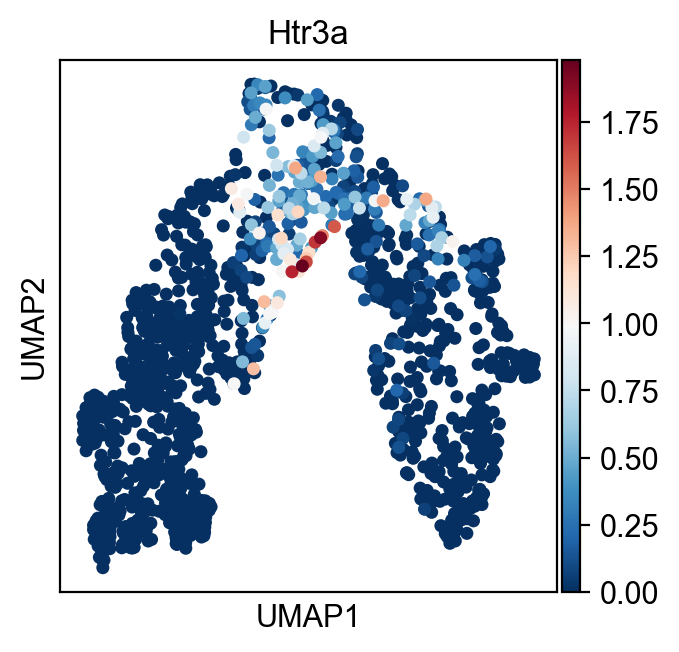

In [18]:
sc.pl.umap(adata,color="Htr3a",use_raw=False)

In [19]:
sc.get.rank_genes_groups_df(adata_focus,"4").set_index("names").loc["Htr3a"]

scores            9.904672e+00
logfoldchanges    3.379353e+00
pvals             9.091000e-17
pvals_adj         4.861049e-15
Name: Htr3a, dtype: float64

In [20]:
adata_focus.layers["scaled"]=sc.pp.scale(adata_focus.X,copy=True,max_value=10)

In [21]:
sc.get.rank_genes_groups_df(adata_focus,"3")

,names,scores,logfoldchanges,pvals,pvals_adj
0,Dpysl3,16.868147,1.082605,1.324163e-45,6.714612e-42
1,Tubb3,14.350437,1.143522,1.491855e-32,1.973464e-29
2,Nfasc,13.708023,0.915411,8.878546e-30,9.004325e-27
3,Miat,12.486868,1.319207,2.154864e-25,1.289695e-22
4,Hsp90ab1,11.374582,0.347532,1.313916e-24,7.138553e-22
...,...,...,...,...,...
30420,Ampd3,-15.450623,-2.662728,1.768637e-45,7.687255e-42
30421,Doc2b,-15.992257,-2.859222,9.986973e-49,7.596341e-45
30422,Ppfia2,-16.542582,-2.972832,4.280626e-51,4.341269e-47
30423,Gch1,-18.576853,-3.727614,1.425305e-62,2.168245e-58


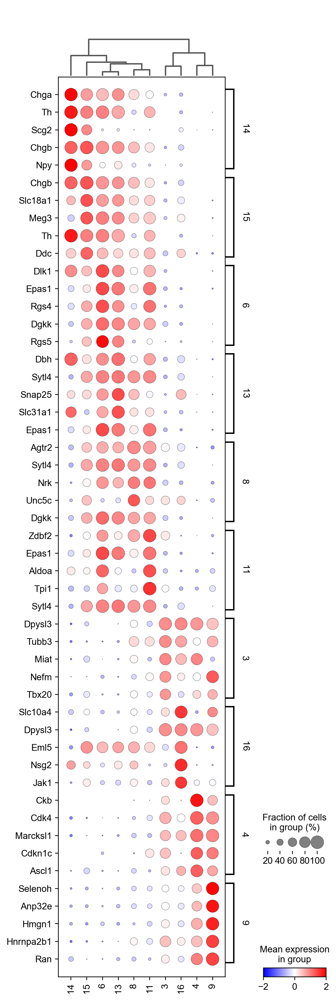

In [23]:
sc.tl.dendrogram(adata_focus,"leiden")
sc.pl.rank_genes_groups_dotplot(adata_focus,n_genes=5,layer="scaled",vmin=-2,vmax=2,cmap="bwr",min_logfoldchange=1,swap_axes=True,save="focus_markers.svg")

In [24]:
sc.tl.rank_genes_groups(adata_focus,"leiden",use_raw=False)

In [25]:
cls=["14","15","6","13","8","11","3","16","4","9"]
custom_martkers=dict(zip(cls,[sc.get.rank_genes_groups_df(adata_focus,c,log2fc_min=l).names.values[:5] for c,l in zip(cls,[3,3,3,3,2.1,3,2.1,3,3,3])]))

In [46]:
ax["mainplot_ax"].figure.get_figheight()

19.3

In [47]:
ax["mainplot_ax"].figure.get_figwidth()

3.7

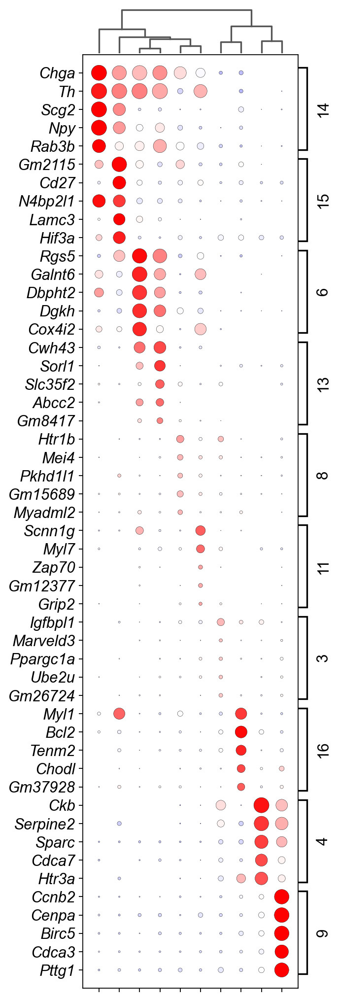

In [69]:
sc.set_figure_params(dpi_save=600)
ax=sc.pl.dotplot(adata_focus,custom_martkers,
              groupby="leiden",dendrogram=True,figsize=(5,16),
              layer="scaled",colorbar_title="mean z-score",
              vmin=-2,vmax=2,cmap="bwr",swap_axes=True,show=False)
main = ax["mainplot_ax"].get_position().bounds
groups=ax["gene_group_ax"].get_position().bounds
leg=ax["size_legend_ax"].get_position().bounds
dend=ax["group_extra_ax"].get_position().bounds
tot_width=leg[0]+leg[2]
toadd=tot_width-groups[0]

ax["size_legend_ax"].remove()
ax["color_legend_ax"].remove()
ax["gene_group_ax"].set_position([groups[0]+toadd,groups[1],groups[2],groups[3]])
ax["mainplot_ax"].set_position([main[0],main[1],main[2]+toadd,main[3]])
ax["group_extra_ax"].set_position([dend[0],dend[1],dend[2]+toadd,dend[3]])
ax["mainplot_ax"].figure.set_figwidth(ax["mainplot_ax"].figure.get_figwidth()-1.5)
plt.setp(ax['mainplot_ax'].get_yticklabels(),fontsize=14, rotation=0, ha="right", rotation_mode="anchor",style="italic");
ax['mainplot_ax'].set_xticklabels(["" for i in range(10)]);
plt.setp(ax["gene_group_ax"].texts,fontsize=14, rotation=90,ha="center");

plt.savefig("figures/dotplot_leiden15.pdf")

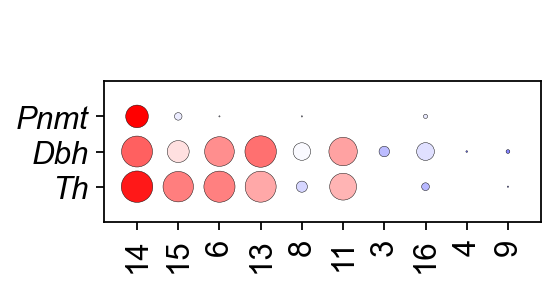

In [72]:
sc.set_figure_params(dpi_save=600)
ax=sc.pl.dotplot(adata_focus,["Pnmt","Dbh","Th"],
              groupby="leiden",dendrogram=True,figsize=(3.5,1.7),
              layer="scaled",colorbar_title="mean z-score",
              vmin=-2,vmax=2,cmap="bwr",swap_axes=True,show=False)
main = ax["mainplot_ax"].get_position().bounds
leg=ax["size_legend_ax"].get_position().bounds
dend=ax["group_extra_ax"].get_position().bounds
tot_width=leg[0]+leg[2]
toadd=tot_width

ax["size_legend_ax"].remove()
ax["color_legend_ax"].remove()
ax["group_extra_ax"].remove()
ax["mainplot_ax"].set_position([main[0],main[1],main[2]+toadd,main[3]])
ax["mainplot_ax"].figure.set_figwidth(ax["mainplot_ax"].figure.get_figwidth()-1.5)
plt.setp(ax['mainplot_ax'].get_yticklabels(),fontsize=14, rotation=0, ha="right", rotation_mode="anchor",style="italic");
plt.setp(ax['mainplot_ax'].get_xticklabels(),fontsize=14, rotation=90,ha="right",va="center",rotation_mode="anchor");

plt.savefig("figures/dotplot_known.pdf")

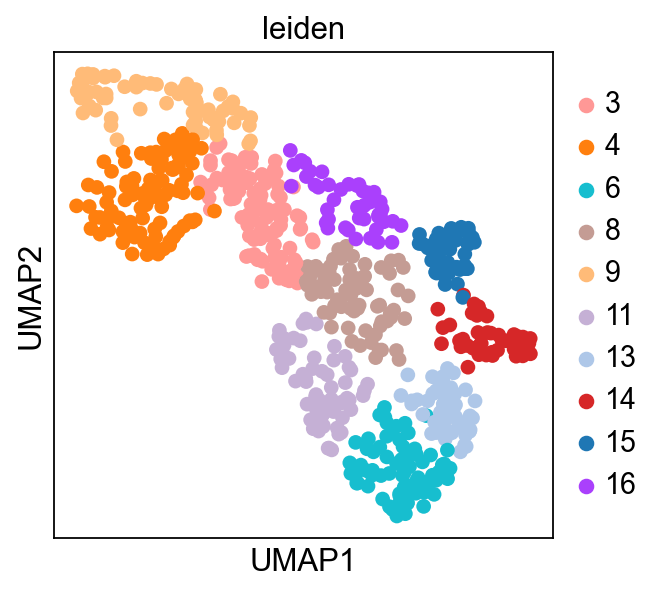

In [73]:
sc.pl.umap(adata_focus,color="leiden")

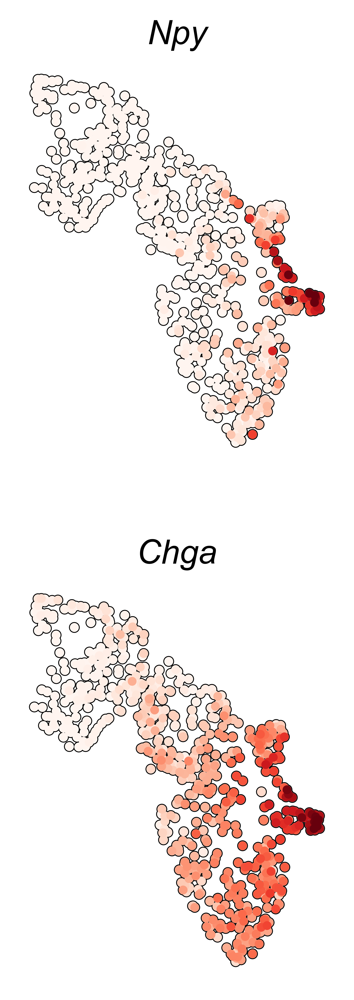

In [79]:
genes=["Npy","Chga"]
axs=scv.pl.umap(adata_focus,color=genes,cmap="Reds",use_raw=False,show=False,
            colorbar=False,add_outline=True,outline_width=(0.1,0.01),s=40,perc=[1,99.5],ncols=1,
            dpi=600)
for g,ax in zip(genes,axs):
    ax.set_title(g,style="italic")
plt.savefig("figures/scvelo_markers_precise_2.pdf")

In [81]:
["Npy","Chga"]
scv.set_figure_params(figsize=(2,3),dpi_save=600)
genes=["Rab3b","Hif3a","Cox4i2","Slc35f2","Htr1b","Myl7","Igfbpl1","Bcl2","Htr3a","Sparc","Ccnb2","Birc5"]
axs=scv.pl.umap(adata_focus,color=genes,cmap="Reds",use_raw=False,
            colorbar=False,add_outline=True,outline_width=(0.1,0.01),s=40,perc=[1,99.5],ncols=4,dpi=600,show=False)

for g,ax in zip(genes,axs):
    ax.set_title(g,style="italic")
plt.savefig("figures/scvelo_markers_precise.pdf")

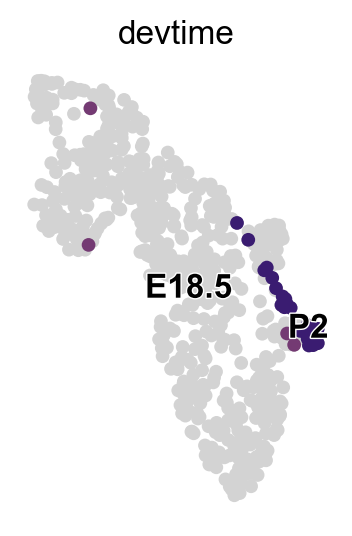

In [87]:
scv.pl.umap(adata_focus,color="devtime",groups=["E18.5","P2"],smooth=True)

In [89]:
sc.pp.neighbors(adata_focus)

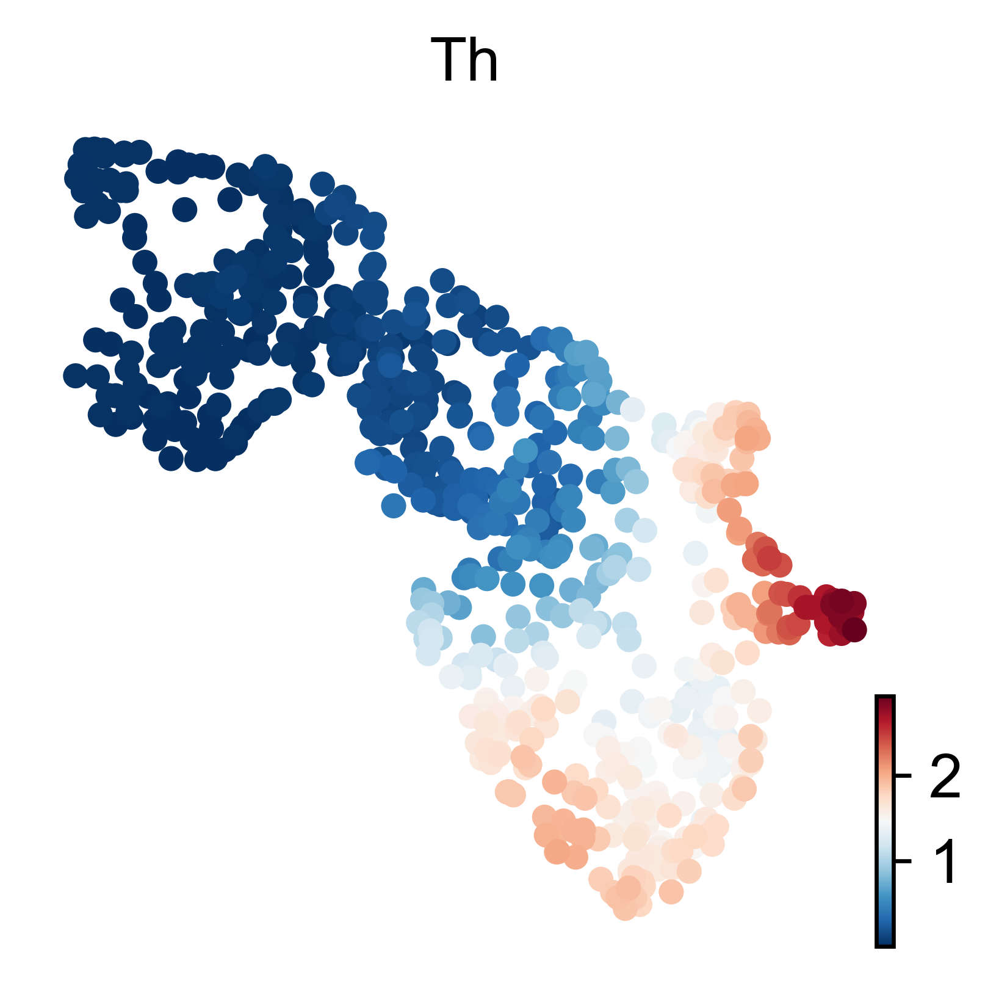

In [111]:
scv.pl.umap(adata_focus,color="Th",smooth=True,use_raw=False,)

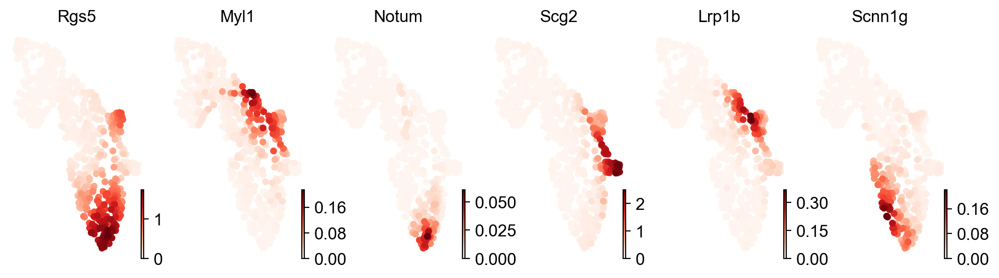

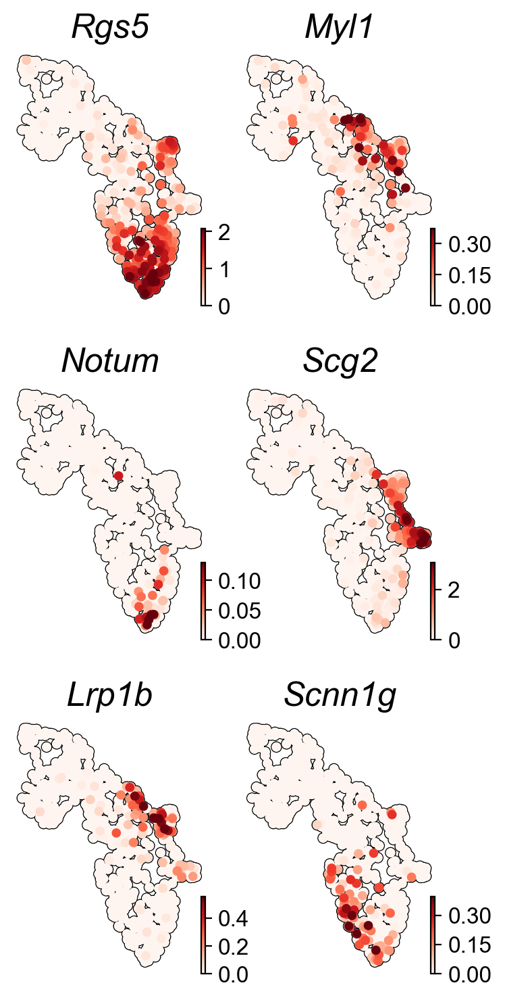

In [116]:
scv.pl.umap(adata_focus,color=["Rgs5","Myl1","Notum","Scg2","Lrp1b","Scnn1g"],use_raw=False,smooth=True,cmap="Reds")
scv.set_figure_params(figsize=(2,3),dpi_save=600)
genes=["Rgs5","Myl1","Notum","Scg2","Lrp1b","Scnn1g"]
axs=scv.pl.umap(adata_focus,color=genes,use_raw=False,smooth=False,cmap="Reds",perc=[1,99.5],ncols=2,
                add_outline=True,outline_width=(0.1,0.01),show=False)

for g,ax in zip(genes,axs):
    ax.set_title(g,style="italic",fontsize=18)
plt.savefig("figures/scvelo_markers_validations3.pdf")

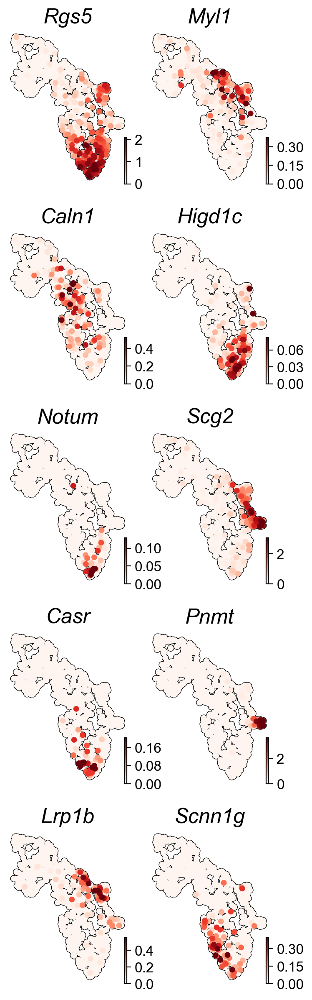

In [118]:
genes=["Rgs5","Myl1","Caln1","Higd1c","Notum","Scg2","Casr","Pnmt","Lrp1b","Scnn1g"]

axs=scv.pl.umap(adata_focus,color=genes,use_raw=False,smooth=False,cmap="Reds",perc=[1,99.5],ncols=2,
                add_outline=True,outline_width=(0.1,0.01),show=False)

for g,ax in zip(genes,axs):
    ax.set_title(g,style="italic",fontsize=18)
plt.savefig("figures/scvelo_markers_validations3.pdf")

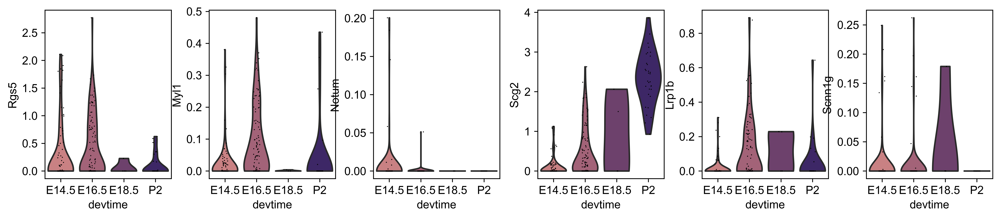

<Figure size 900x900 with 0 Axes>

In [112]:
scv.set_figure_params(figsize=(3,3),dpi=300)
sc.pl.violin(adata_focus[adata_focus.obs.devtime.isin(["P2","E18.5","E16.5","E14.5"])],["Rgs5","Myl1","Notum","Scg2","Lrp1b","Scnn1g"],
             groupby="devtime",use_raw=False)
plt.tight_layout()